# Feature selection 

### On Nutrition Facts for McDonald's Menu

Author: Nutan Mandale

Mentor: Vincent Ramdhanie

Date: 2017/03/28

### Data Description:

This dataset provides a nutrition analysis of every menu item on the US McDonald's menu, including breakfast, beef burgers, chicken and fish sandwiches, fries, salads, soda, coffee and tea, milkshakes, and desserts.

McDonald's is one example of popular fast food joint. With this data set I am trying to explore the nutritional facts of the food served there as well as different features that can be used to find the effect of food served there on human health.

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from matplotlib.mlab import PCA as mlabPCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 

In [2]:
#import csv
menu = pd.read_csv("./menu.csv")

In [3]:
menu.rename(columns={'Serving Size': 'Servingsize','Calories from Fat': 'CaloriesfromFat','Total Fat': 'TotalFat','Total Fat (% Daily Value)': 'TotalFat%DailyValue','Saturated Fat': 'SaturatedFat','Saturated Fat (% Daily Value)': 'SaturateFat%DailyValue','Trans Fat': 'TransFat','Cholesterol (% Daily Value)': 'Cholesterol%DailyValue','Dietary Fiber': 'DietaryFiber','Dietary Fiber (% Daily Value)': 'DietaryFiber%DailyValue','Vitamin A (% Daily Value)': 'VitaminA%DailyValue','Carbohydrates (% Daily Value)': 'Carbohydrates%DailyValue','Sodium (% Daily Value)': 'Sodium%DailyValue','Vitamin C (% Daily Value)': 'VitaminC%DailyValue','Calcium (% Daily Value)': 'Calcium%DailyValue','Iron (% Daily Value)' : 'Iron%DailyValue'}, inplace =True)

In [4]:
menu.head(3)

,Category,Item,Servingsize,Calories,CaloriesfromFat,TotalFat,TotalFat%DailyValue,SaturatedFat,SaturateFat%DailyValue,TransFat,...,Carbohydrates,Carbohydrates%DailyValue,DietaryFiber,DietaryFiber%DailyValue,Sugars,Protein,VitaminA%DailyValue,VitaminC%DailyValue,Calcium%DailyValue,Iron%DailyValue
0,Breakfast,Egg McMuffin,4.8 oz (136 g),300,120,13.0,20,5.0,25,0.0,...,31,10,4,17,3,17,10,0,25,15
1,Breakfast,Egg White Delight,4.8 oz (135 g),250,70,8.0,12,3.0,15,0.0,...,30,10,4,17,3,18,6,0,25,8
2,Breakfast,Sausage McMuffin,3.9 oz (111 g),370,200,23.0,35,8.0,42,0.0,...,29,10,4,17,2,14,8,0,25,10


In [5]:
# Check for Nulls
print(menu.isnull().any())

Category                    False
Item                        False
Servingsize                 False
Calories                    False
CaloriesfromFat             False
TotalFat                    False
TotalFat%DailyValue         False
SaturatedFat                False
SaturateFat%DailyValue      False
TransFat                    False
Cholesterol                 False
Cholesterol%DailyValue      False
Sodium                      False
Sodium%DailyValue           False
Carbohydrates               False
Carbohydrates%DailyValue    False
DietaryFiber                False
DietaryFiber%DailyValue     False
Sugars                      False
Protein                     False
VitaminA%DailyValue         False
VitaminC%DailyValue         False
Calcium%DailyValue          False
Iron%DailyValue             False
dtype: bool


In [6]:
#data set rows and columns
menu.shape

(260, 24)

## Categorical Variable

In [7]:
#List unique values in the df['name'] column
menu.Category.unique()

array(['Breakfast', 'Beef & Pork', 'Chicken & Fish', 'Salads',
       'Snacks & Sides', 'Desserts', 'Beverages', 'Coffee & Tea',
       'Smoothies & Shakes'], dtype=object)

In this dataset we have 2 categorical variables Category and Item

In [8]:
drinksdf = menu[(menu.Category == 'Coffee & Tea') | (menu.Category == 'Beverages')| (menu.Category == 'Smoothies & Shakes')]

In [9]:
drinksdf.shape

(150, 24)

In [10]:
eatsdf =menu[-((menu.Category == 'Coffee & Tea') | (menu.Category == 'Beverages')| (menu.Category == 'Smoothies & Shakes'))]

In [11]:
eatsdf.shape

(110, 24)

In [12]:
print(pd.crosstab(menu.Item, [menu.Category], rownames=['Item'], colnames=['Category']))

Category                                            Beef & Pork  Beverages  \
Item                                                                         
1% Low Fat Milk Jug                                           0          1   
Apple Slices                                                  0          0   
Bacon Buffalo Ranch McChicken                                 0          0   
Bacon Cheddar McChicken                                       0          0   
Bacon Clubhouse Burger                                        1          0   
Bacon Clubhouse Crispy Chicken Sandwich                       0          0   
Bacon Clubhouse Grilled Chicken Sandwich                      0          0   
Bacon McDouble                                                1          0   
Bacon, Egg & Cheese Bagel                                     0          0   
Bacon, Egg & Cheese Bagel with Egg Whites                     0          0   
Bacon, Egg & Cheese Biscuit (Large Biscuit)                   0 

In [13]:
import re
def servesize(Servingsize):
    s_s = re.findall('\d+ g',Servingsize)
    if len(s_s) > 0:
        return s_s[0]
    else:
        return 0

In [14]:
eatsdf['Servingsize'] = eatsdf['Servingsize'].apply(servesize)

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [15]:
eatsdf.tail(3)

,Category,Item,Servingsize,Calories,CaloriesfromFat,TotalFat,TotalFat%DailyValue,SaturatedFat,SaturateFat%DailyValue,TransFat,...,Carbohydrates,Carbohydrates%DailyValue,DietaryFiber,DietaryFiber%DailyValue,Sugars,Protein,VitaminA%DailyValue,VitaminC%DailyValue,Calcium%DailyValue,Iron%DailyValue
107,Desserts,Hot Fudge Sundae,179 g,330,80,9.0,14,7.0,34,0.0,...,53,18,1,3,48,8,8,0,25,8
108,Desserts,Hot Caramel Sundae,182 g,340,70,8.0,12,5.0,24,0.0,...,60,20,0,0,43,7,10,0,25,0
109,Desserts,Strawberry Sundae,178 g,280,60,6.0,10,4.0,20,0.0,...,49,16,0,0,45,6,8,4,20,0


In [16]:
import math

def drinksize(Servingsize):
    d_s = re.search('(\d+ fl oz)|(\d+ ml)',Servingsize)
    if d_s is not None:
        if 'ml' in d_s.group(0):
            ml_amt = re.search('\d+', d_s.group(0))
            if ml_amt is not None:
                num = float(ml_amt.group(0)) * 0.033814
                return math.ceil(num)
            else:
                return 0
        else:
            oz_amt = re.search('\d+', d_s.group(0))
            if oz_amt is not None:
                return int(oz_amt.group(0))
            else:
                return 0
    else:
        return 0
drinksize('1 carton (236 ml)')

8

In [17]:
drinksdf['Servingsize'] = drinksdf['Servingsize'].apply(drinksize)

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [18]:
drinksdf[['Item','Servingsize']].head(3)

,Item,Servingsize
110,Coca-Cola Classic (Small),16
111,Coca-Cola Classic (Medium),21
112,Coca-Cola Classic (Large),30


In [19]:
eatsdf.Servingsize = eatsdf.Servingsize.apply(lambda x: float(x[:-1]))

C:\Users\NutanMandale\Anaconda3\lib\site-packages\pandas\core\generic.py:2701: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


Here we have seperted items according to categories.Hereby creating 2 new features.

Let us consider each feature seperatly.

## Univariate Plots

## Feature 1 -- Calories

Calories in food is supposed to be major cause of obesity. More the calorie intake per meal and less burning out of calories significantly increases chances of obesity in an individual

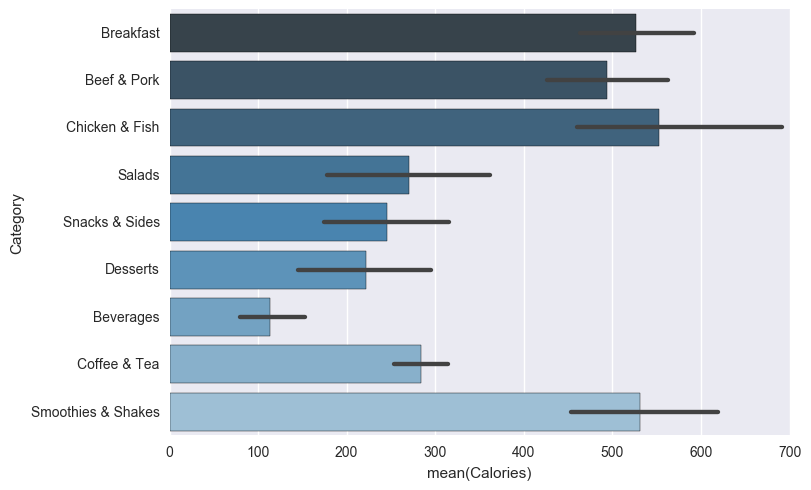

In [20]:
ax = sns.barplot(x="Calories", y="Category", data=menu, palette="Blues_d");

Here we see smothies and shakes have higher mean calories than that of desserts.

In [21]:
breakfast_df = menu[menu.Category == 'Breakfast']
beefpork_df = menu[menu.Category == 'Beef & Pork']
chi_fi_df = menu[menu.Category == 'Chicken & Fish']
salads_df = menu[menu.Category == 'Salads']
sn_si_df = menu[menu.Category == 'Snacks & Sides']
desserts_df = menu[menu.Category == 'Desserts']
beverages_df = menu[menu.Category == 'Beverages']
coffee_tea_df = menu[menu.Category == 'Coffee & Tea']
smoothies_shakes_df = menu[menu.Category == 'Smoothies & Shakes']

With each category we create a new feature.

### Calories in food served in McDonalds

The Calories vary by items but surprisingly we see desserts have less calories than smoothies & shakes so it is important to create a new feature of calories per gram of servings.

In [24]:
eatsdf['caloriespergm'] = eatsdf['Calories']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


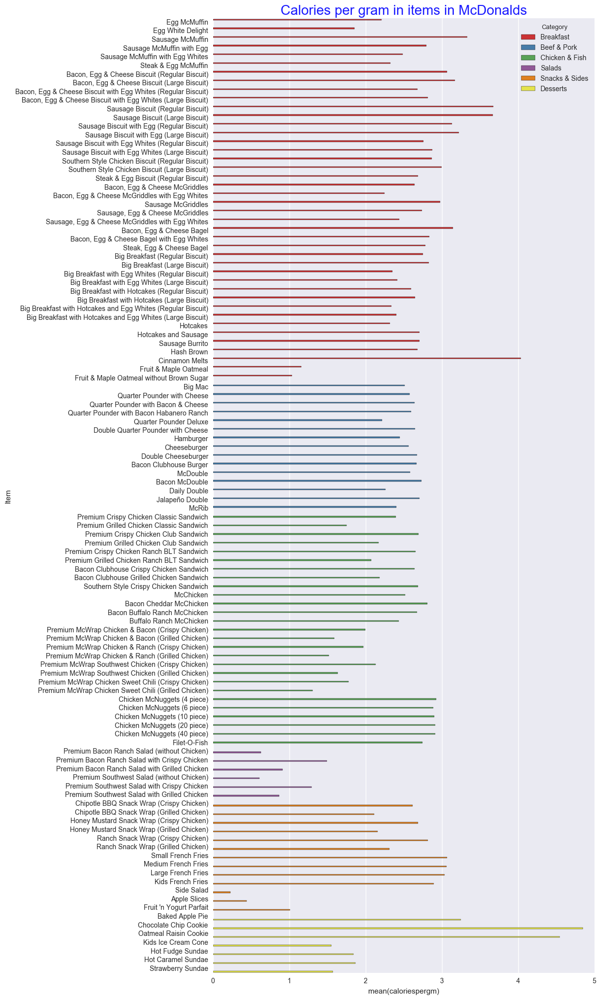

In [25]:
ax = sns.barplot(x="caloriespergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Calories per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

### Calories per ml in drinks served in McDonalds

In [26]:
drinksdf['caloriespergm'] = drinksdf['Calories']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


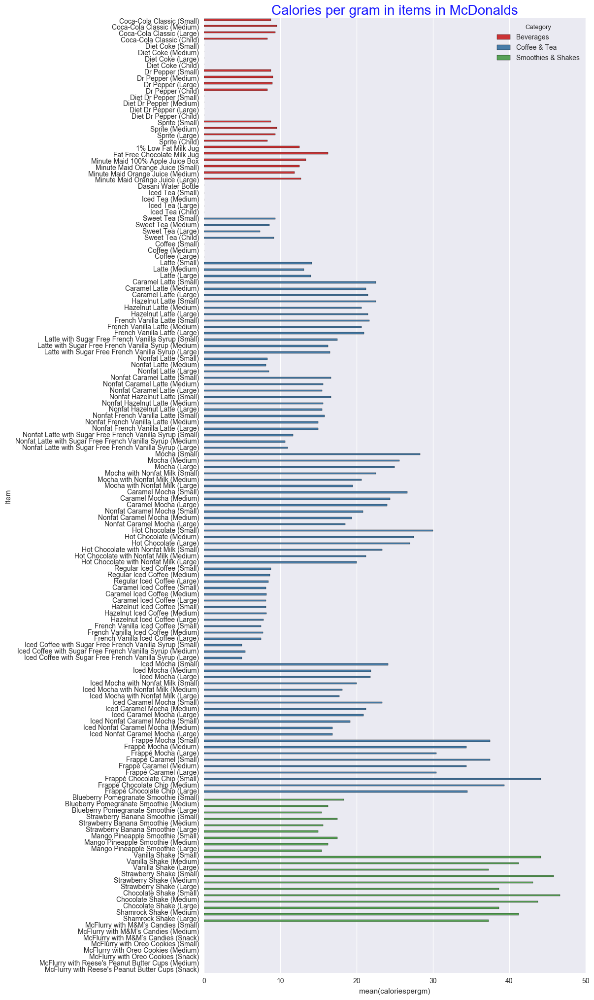

In [27]:
ax = sns.barplot(x="caloriespergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Calories per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

Some of the values are not in the liquid measurements so cannot be used for data anlysis.

## Feature 2 -- Dietary Fiber  

### Dietary Fiber in food served .. 

In [28]:
eatsdf['fiberpergm'] = eatsdf['DietaryFiber']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


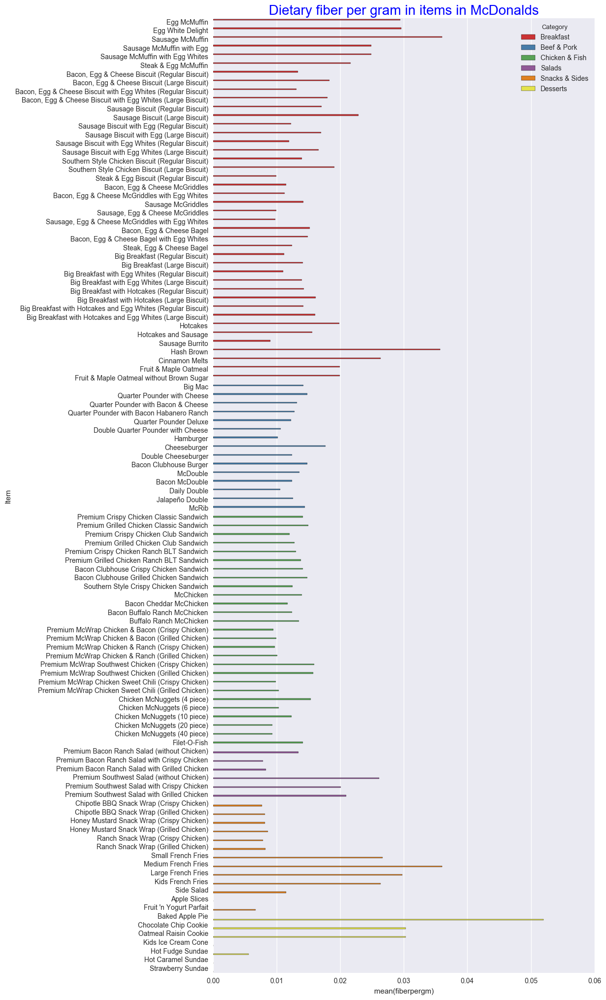

In [29]:
ax = sns.barplot(x="fiberpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Dietary fiber per gram in items in McDonalds',
    fontsize=20,color="b",alpha=1);

### Dietary Fiber in drinks served ..

In [30]:
drinksdf['fiberpergm'] = drinksdf['DietaryFiber']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


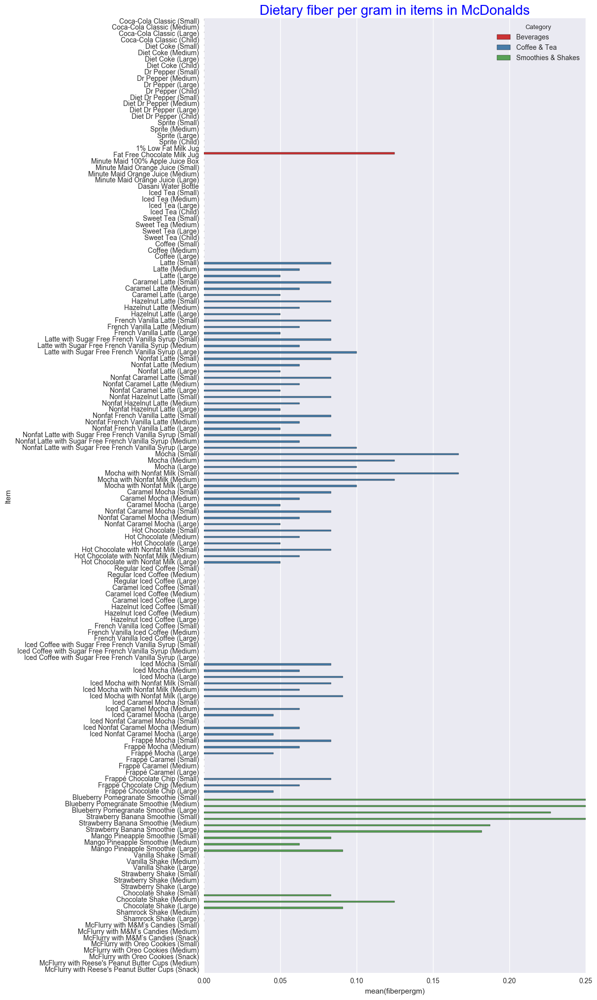

In [31]:
ax = sns.barplot(x="fiberpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Dietary fiber per gram in items in McDonalds',
    fontsize=20,color="b",alpha=1);

## Feature 3 -- Cholestrol

### Cholestrol in food served ..

In [32]:
eatsdf['cholestrolpergm'] = eatsdf['Cholesterol']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


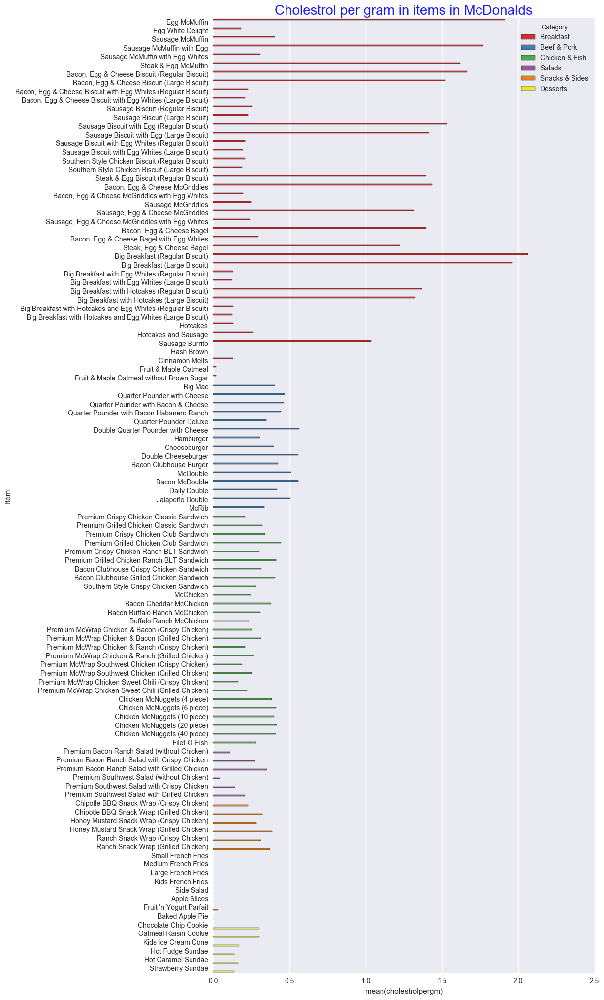

In [33]:
ax = sns.barplot(x="cholestrolpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Cholestrol per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

### Cholestrol in drinks served ..

In [34]:
drinksdf['cholestrolpergm'] = drinksdf['Cholesterol']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


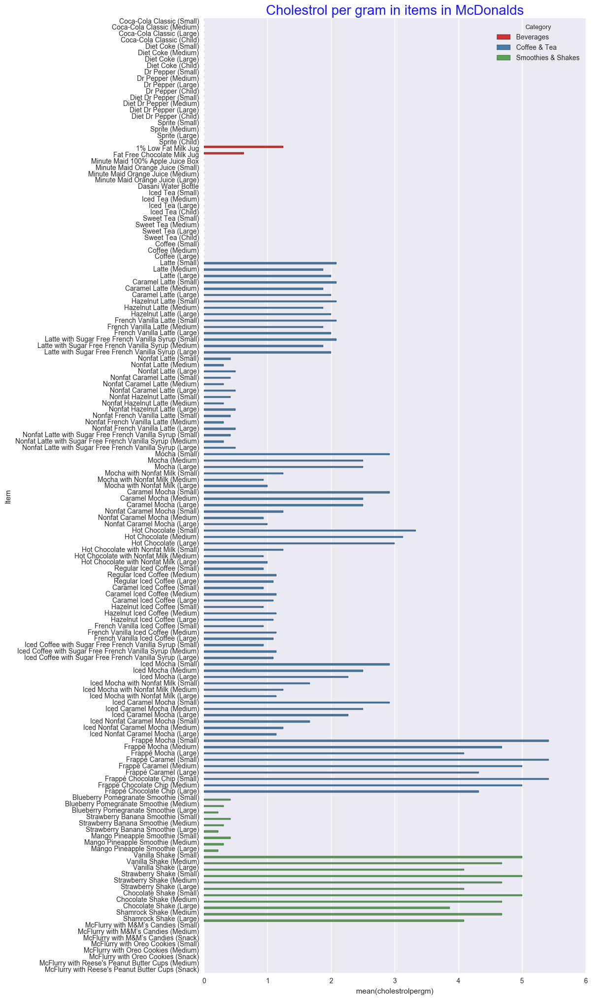

In [35]:
ax = sns.barplot(x="cholestrolpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Cholestrol per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

## Feature 4 --Sugar

### Sugar in food served ..

In [36]:
eatsdf['sugarpergm'] = eatsdf['Sugars']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


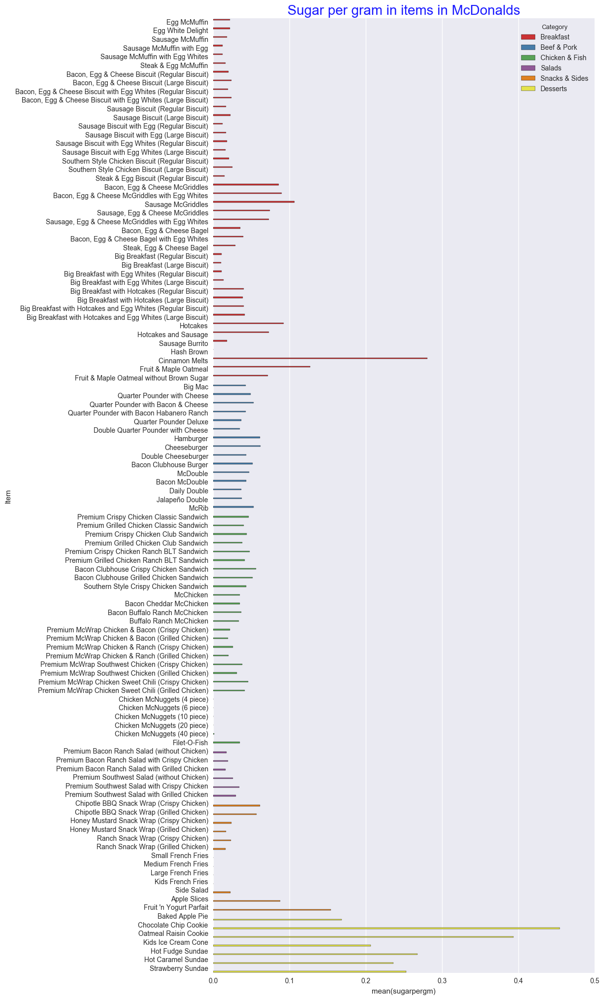

In [37]:
ax = sns.barplot(x="sugarpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Sugar per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

### Sugar in drinks served ..

In [38]:
drinksdf['sugarpergm'] = drinksdf['Sugars']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


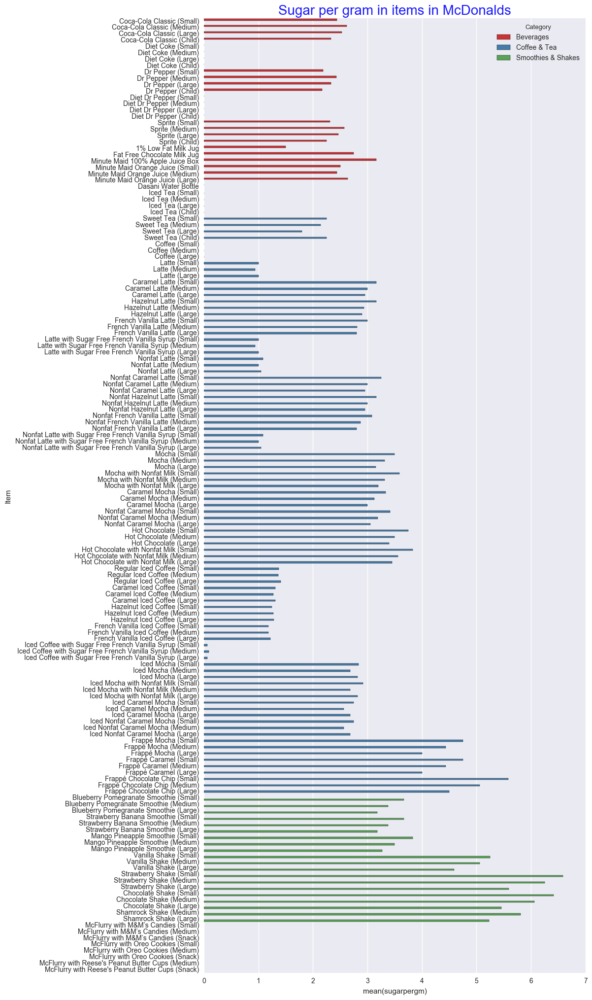

In [39]:
ax = sns.barplot(x="sugarpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Sugar per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

## Feature 5 -- Carbohydrates

### Carbohydrates in food served ..

In [40]:
eatsdf['carbohydratepergm'] = eatsdf['Carbohydrates']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


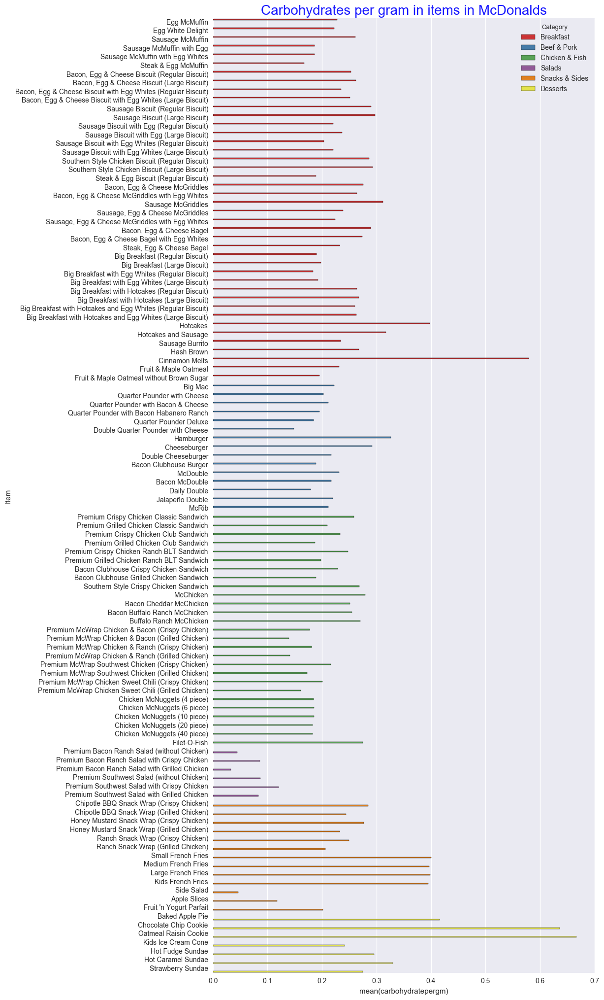

In [41]:
ax = sns.barplot(x="carbohydratepergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Carbohydrates per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

### Carbohydrates in drinks served ..

In [42]:
drinksdf['carbohydratepergm'] = drinksdf['Carbohydrates']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


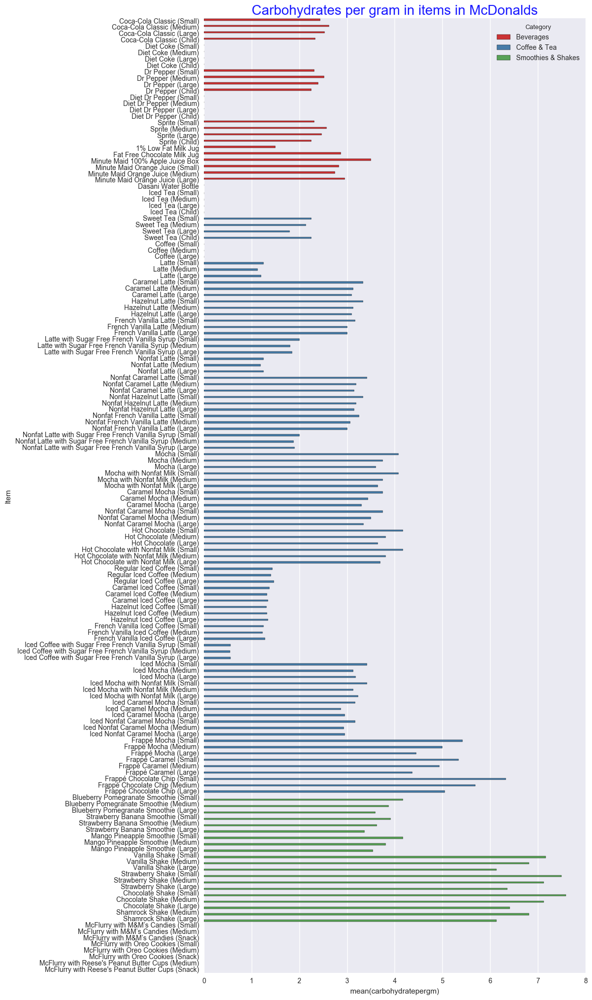

In [43]:
ax = sns.barplot(x="carbohydratepergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Carbohydrates per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.9);

## Feature 6-- Sodium

### Sodium in drinks served .. 

In [44]:
drinksdf['sodiumpergm'] = drinksdf['Sodium']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


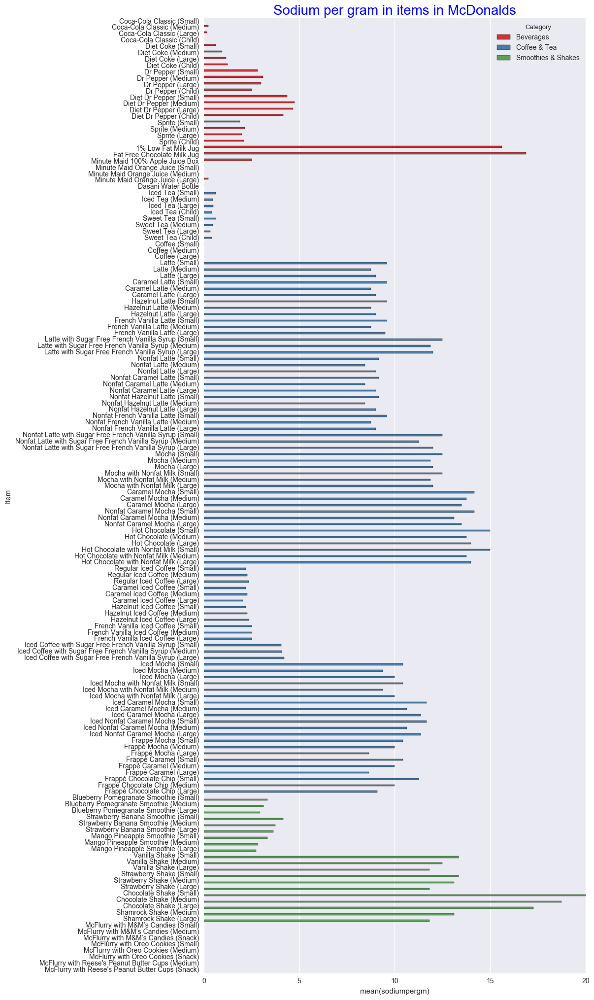

In [45]:
ax = sns.barplot(x="sodiumpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Sodium per gram in items in McDonalds',
    fontsize=20,color="b",alpha=1);

### Sodium in food served ..

In [46]:
eatsdf['sodiumpergm'] = eatsdf['Sodium']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


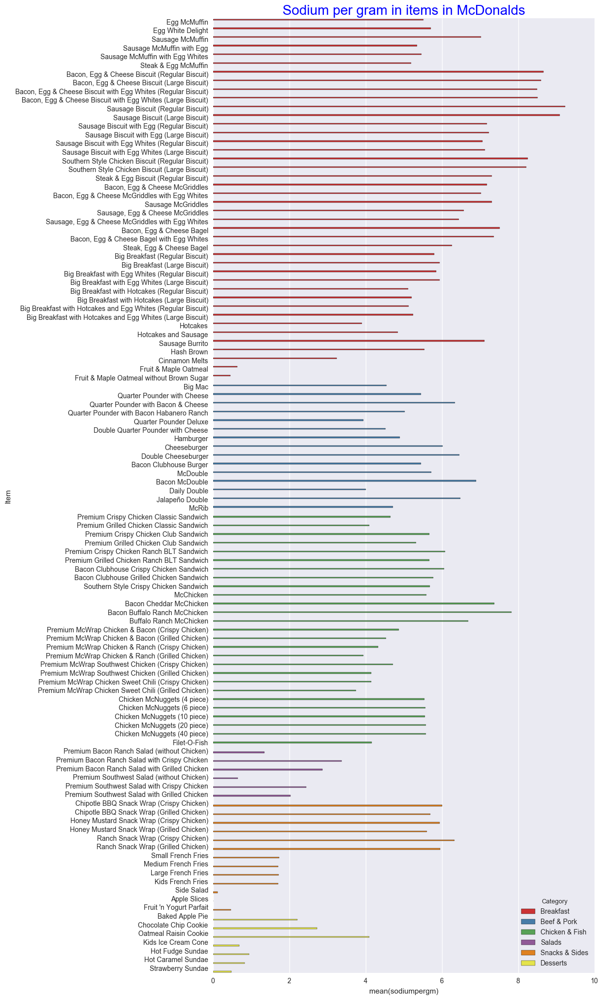

In [47]:
ax = sns.barplot(x="sodiumpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Sodium per gram in items in McDonalds',
    fontsize=20,color="b",alpha=1);

## Feature 7--Protein

### Protein in food served

In [48]:
eatsdf['proteinpergm'] = eatsdf['Protein']/eatsdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


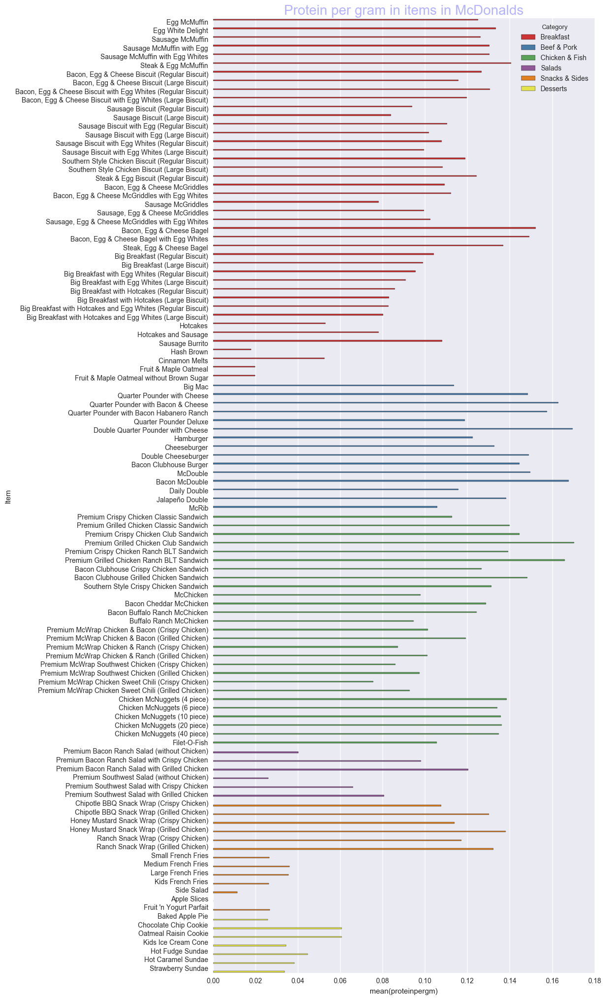

In [49]:
ax = sns.barplot(x="proteinpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=eatsdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Protein per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.3);

### Protein in drinks served

In [50]:
drinksdf['proteinpergm'] = drinksdf['Protein']/drinksdf['Servingsize']

C:\Users\NutanMandale\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


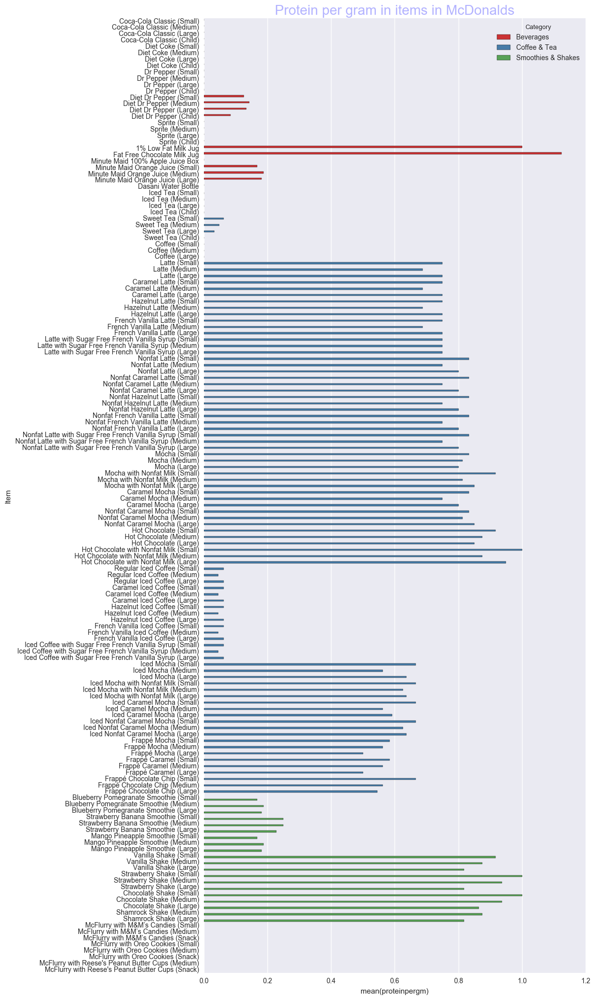

In [51]:
ax = sns.barplot(x="proteinpergm", 
                 y="Item", 
                 hue = 'Category',
                 data=drinksdf,                  
                 palette="Set1")
ax.figure.set_size_inches(10,25)
ax.axes.set_title('Protein per gram in items in McDonalds',
    fontsize=20,color="b",alpha=0.3);

All the above variables are univariate.

## Bivariate plots

Let us compare calories per gram in different categories to other variables.

In [52]:
eatsdf.columns

Index(['Category', 'Item', 'Servingsize', 'Calories', 'CaloriesfromFat',
       'TotalFat', 'TotalFat%DailyValue', 'SaturatedFat',
       'SaturateFat%DailyValue', 'TransFat', 'Cholesterol',
       'Cholesterol%DailyValue', 'Sodium', 'Sodium%DailyValue',
       'Carbohydrates', 'Carbohydrates%DailyValue', 'DietaryFiber',
       'DietaryFiber%DailyValue', 'Sugars', 'Protein', 'VitaminA%DailyValue',
       'VitaminC%DailyValue', 'Calcium%DailyValue', 'Iron%DailyValue',
       'caloriespergm', 'fiberpergm', 'cholestrolpergm', 'sugarpergm',
       'carbohydratepergm', 'sodiumpergm', 'proteinpergm'],
      dtype='object')

In [53]:
drinksdf.columns

Index(['Category', 'Item', 'Servingsize', 'Calories', 'CaloriesfromFat',
       'TotalFat', 'TotalFat%DailyValue', 'SaturatedFat',
       'SaturateFat%DailyValue', 'TransFat', 'Cholesterol',
       'Cholesterol%DailyValue', 'Sodium', 'Sodium%DailyValue',
       'Carbohydrates', 'Carbohydrates%DailyValue', 'DietaryFiber',
       'DietaryFiber%DailyValue', 'Sugars', 'Protein', 'VitaminA%DailyValue',
       'VitaminC%DailyValue', 'Calcium%DailyValue', 'Iron%DailyValue',
       'caloriespergm', 'fiberpergm', 'cholestrolpergm', 'sugarpergm',
       'carbohydratepergm', 'sodiumpergm', 'proteinpergm'],
      dtype='object')

### Calories to carbohydrates

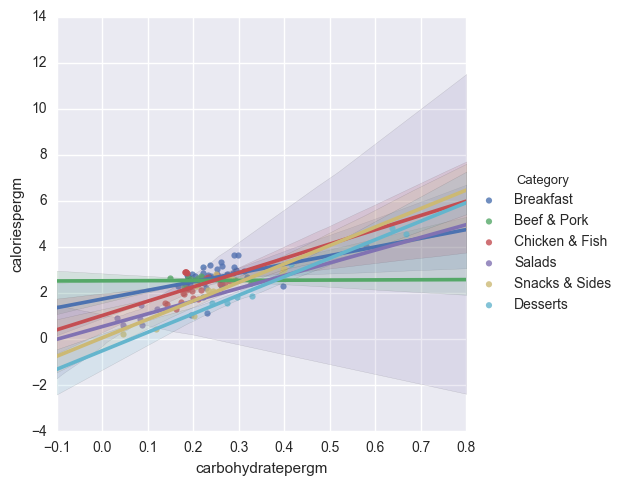

In [54]:
g = sns.lmplot(x="carbohydratepergm", y="caloriespergm", hue="Category", data=eatsdf)

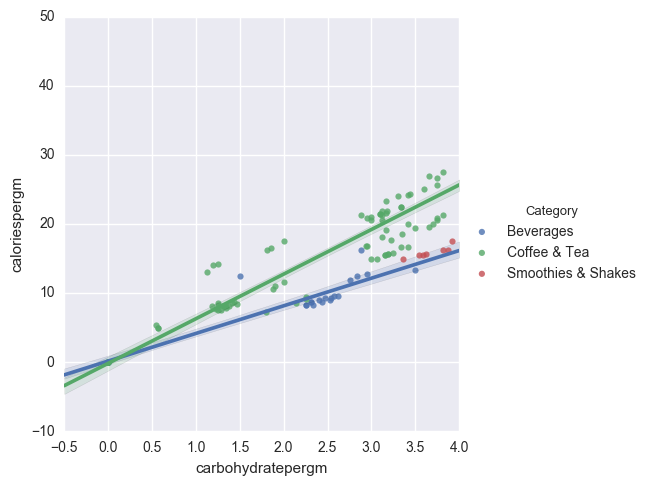

In [55]:
g = sns.lmplot(x="carbohydratepergm", y="caloriespergm", hue="Category", data=drinksdf)

Here we see as carbohydrates per gram increases so does calories per gram increases.

### Calories to sugars

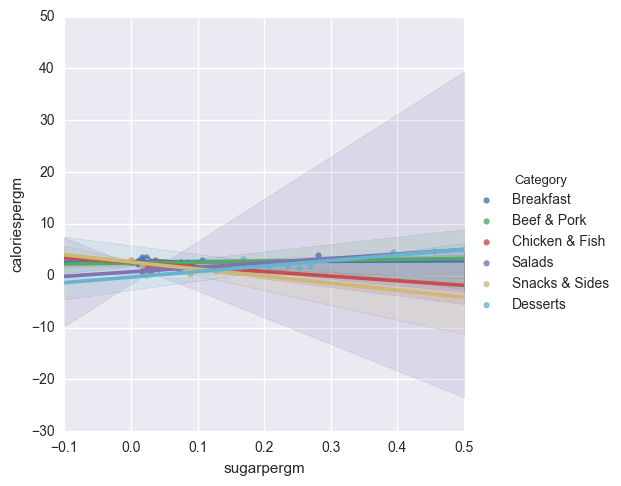

In [56]:
g = sns.lmplot(x="sugarpergm", y="caloriespergm", hue="Category", data=eatsdf)

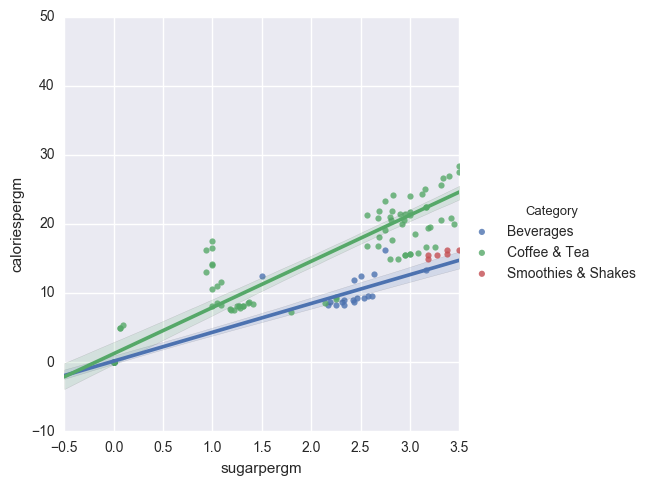

In [57]:
g = sns.lmplot(x="sugarpergm", y="caloriespergm", hue="Category", data=drinksdf)

### Calories to Protein

g = sns.lmplot(x="proteinpergm", y="caloriespergm", hue="Category", data=eatsdf)

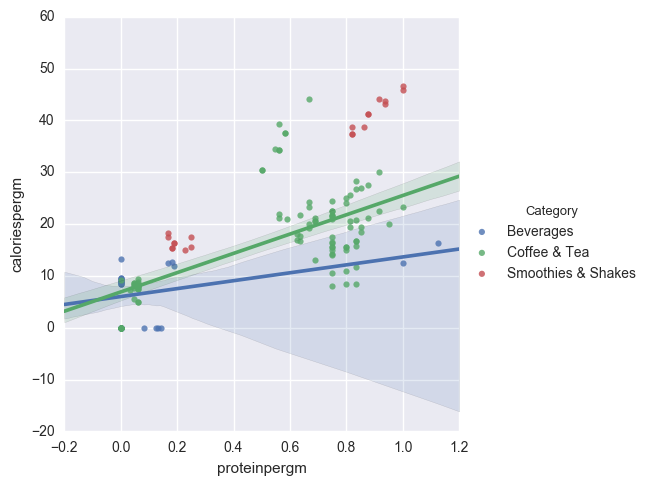

In [58]:
g = sns.lmplot(x="proteinpergm", y="caloriespergm", hue="Category", data=drinksdf)